This notebook allows you to scrape the ASKAP archive (CASDA) for all observations of a single source.

This notebook has three parts:
1) download the selavy source finder catalogues and image cutouts available on CASDA.
2) construct a dataframe taht contains information for all these observations: detection flux, time etc. If not source is detected, performe a forced flux extraction based on the cutou
3) plot the light curve and the cutouts.

In [1]:

import numpy as np
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Import default astropy packages
from astropy.io.votable import parse

from astropy import units as u
from astropy.coordinates import SkyCoord, Distance
from astropy.io import fits
from astroquery.vizier import Vizier
vizier = Vizier()

# Import packages to download from CASDA
from astropy.table import unique
from astropy.table import Table
from astroquery.utils.tap.core import TapPlus
from astroquery.casda import Casda

# Forced fitting
import subprocess
from astropy.stats import sigma_clip

# Plotting image grids
import matplotlib.gridspec as gridspec
from astropy.wcs import WCS
from astropy.visualization import ZScaleInterval

# Suppress warnings
import warnings
from astropy.utils.exceptions import AstropyWarning
warnings.simplefilter('ignore', category=AstropyWarning)

# 1) Part one: download the data from CASDA

### Provide OPAL account

In [2]:
OPAL_USER = "irisderuiter7@gmail.com"          # set to opal login username
casda = Casda()
casda.login(username=OPAL_USER, store_password=True)


INFO: Authenticating irisderuiter7@gmail.com on CASDA ... [astroquery.casda.core]
INFO: Authentication successful! [astroquery.casda.core]


### Helper functions that download image and catalogue data based on ra and dec, or SBID

In [23]:
def list_SBID_imgs(ra, dec, stokes):
    """Create a list with unique SBIDs that cover the source region. """

    coord = SkyCoord(ra, dec, frame='icrs', unit=u.deg)
    
    result_table = casda.query_region(coordinates=coord, radius=5*u.arcmin)
    public_data = casda.filter_out_unreleased(result_table)
    
    mask = (((public_data['quality_level']=='GOOD') | (public_data['quality_level']=='UNCERTAIN'))\
           & (public_data['dataproduct_subtype']=='cont.restored.t0') \
           & (public_data['pol_states']=='/{}/'.format(stokes) ))
    to_cutout = public_data[mask]
    to_cutout_unique = unique(to_cutout, keys='obs_id')
    
    return list(to_cutout_unique['obs_id'])


def download_data_img(ra, dec, stokes):
    """Download stokes I or stokes V cutouts.
    Input:
    - ra, dec of source (in degrees).
    - stokes: 'I' or 'V'. """

    folder_name = 'img_Stokes_'+stokes
    full_folder_name = source_name+'/'+folder_name

    coord = SkyCoord(ra, dec, frame='icrs', unit=u.deg)
    
    result_table = casda.query_region(coordinates=coord, radius=5*u.arcmin)
    public_data = casda.filter_out_unreleased(result_table)
    
    mask = (((public_data['quality_level']=='GOOD') | (public_data['quality_level']=='UNCERTAIN'))\
           & (public_data['dataproduct_subtype']=='cont.restored.t0') \
           & (public_data['pol_states']=='/{}/'.format(stokes) ))
    to_cutout = public_data[mask]
    to_cutout_unique = unique(to_cutout, keys='obs_id')
    
    if os.path.isdir(full_folder_name)==False:
            os.mkdir(full_folder_name)
    
    print(f'There are {len(to_cutout_unique)} cutouts to be downloaded.')
    # If there are a lot of images, divide the download in chunks
    batch_size = 10

    print(f'Found a {len(to_cutout_unique)} unique cutouts, downloading in batches of {batch_size}')
    
    if len(to_cutout_unique)>batch_size:
        for i in range(0,len(to_cutout_unique),batch_size):
            print(f'Downloading Stokes {stokes} images {i} to {i+batch_size} to {full_folder_name}.')
            url_list = casda.cutout(to_cutout_unique[i:i+batch_size], coordinates=coord, radius=5*u.arcmin)
            url_list = [url for url in url_list if url.endswith('.checksum')==False]
            casda.download_files(url_list, savedir=full_folder_name)
    else:
        url_list = casda.cutout(to_cutout_unique, coordinates=coord, radius=5*u.arcmin)
        url_list = [url for url in url_list if url.endswith('.checksum')==False]
        print(f'Downloading Stokes {stokes} images to {full_folder_name}.')
        casda.download_files(url_list, savedir=full_folder_name)
    



def download_data_cat_region(ra, dec):
    """Download selavy cataloges around ra, dec. """


    folder_name = 'cat_Stokes_I'
    full_folder_name = source_name+'/'+folder_name
    if os.path.isdir(full_folder_name)==False:
        os.mkdir(full_folder_name)

    
    tap_qry=("SELECT * FROM ivoa.obscore "
                                   "where( (dataproduct_subtype = 'catalogue.continuum.component')"
                                     f"and (1=CONTAINS(POINT('ICRS', {ra}, {dec}), s_region)) )")

    tap = TapPlus(url="https://casda.csiro.au/casda_vo_tools/tap")
    job = tap.launch_job_async(tap_qry)
    data = job.get_results()
    
    
    # filter out the unreleased data
    cat_data = casda.filter_out_unreleased(data)

    batch_size = 20

    print(f'Found a {len(cat_data)} catalogues, downloading in batches of {batch_size}')

    if len(cat_data) > batch_size:
        for i in range(0,len(cat_data),batch_size):
            print(f'Downloading catalogues {i} to {i+batch_size} to {full_folder_name}.')

            url_list = casda.stage_data(cat_data[i:i+batch_size])
            url_list = [url for url in url_list if url.endswith('.checksum')==False]
        
            print(f'Downloading Stokes I catalogues to {full_folder_name}.')
            casda.download_files(url_list, savedir=full_folder_name)

    else:
        print(f'Downloading catalogues {len(cat_data)} to {full_folder_name}.')
        url_list = casda.stage_data(cat_data)
        url_list = [url for url in url_list if url.endswith('.checksum')==False]
    
        print(f'Downloading Stokes I catalogues to {full_folder_name}.')
        casda.download_files(url_list, savedir=full_folder_name)
    
    return list(data['obs_id'])

def download_data_cat_SBID(SBID_list):
    """For some reason, not all catalogues are captured by the region query.
    Download remaining catalogs based on their SBID."""
    
    url_list_total = []
    for SBID in SBID_list:
        tap_qry=("SELECT * FROM ivoa.obscore "
                                       "where( (dataproduct_subtype = 'catalogue.continuum.component')"
                                         f"and (obs_id = '{SBID}'))")
                                         #f"and (1=CONTAINS(POINT('ICRS', {ra}, {dec}), s_region)) )")
    
        tap = TapPlus(url="https://casda.csiro.au/casda_vo_tools/tap")
        job = tap.launch_job_async(tap_qry)
        data = job.get_results()
        
        # filter out the unreleased data
        cat_data = casda.filter_out_unreleased(data)
        url_list = casda.stage_data(cat_data)
        url_list = [url for url in url_list if url.endswith('.checksum')==False]
        url_list_total.append(url_list[0])
        
    folder_name = 'cat_Stokes_I'
    full_folder_name = source_name+'/'+folder_name
    if os.path.isdir(full_folder_name)==False:
        os.mkdir(full_folder_name)
    
    Casda.download_files(url_list_total, savedir=full_folder_name)

def download_data_cat(obs_ids_image_cutouts):
    """Download catalog data."""
    obs_ids_cat_from_region = download_data_cat_region(ra, dec)

    remaining_download_list = []
    for obs in obs_ids_image_cutouts:
        if obs not in obs_ids_cat_from_region:
            remaining_download_list.append(obs)

    download_data_cat_SBID(remaining_download_list)

### Helper functions

In [4]:
def setup_folders(source_name):
    """Create folders locally where we will save the CASDA data products and plots."""
    if os.path.isdir(source_name+'/')==False:
        os.mkdir(source_name+'/')
    
    if os.path.isdir(source_name+'/plots/')==False:
        os.mkdir(source_name+'/plots/')


def convert_xml_to_pandas(xml_file_name):
    """Selavy source tables are xml files, read them to pandas dataframes."""
    votable = parse(xml_file_name)
    table = votable.get_first_table()
    bill = table.to_table(use_names_over_ids=True)
    return bill.to_pandas()


def create_SBID_list(source_name):
    """Based on the cutouts, create a list with relevant SBIDs."""
    file_list = glob.glob(f'{source_name}/img_Stokes_I/*fits')
    SBID_list = []
    for fits_image_filename in file_list:
        hdul = fits.open(fits_image_filename)
        
        SBID = hdul[0].header['SBID']
        SBID_list.append('ASKAP-'+SBID)
    return SBID_list

# 2) Construct dataframe from downloads

In [29]:
def force_extract_flux(fits_image_filename, data, ra, dec, bmaj):
    """
    Return the forced flux extraction from the image cutout in mJy.
    - input fits_image_filename: location of the fits image on which to perform hte forced flux extraction
    - data: grid of pixel values in the fits image, used for noise estimation.
    - ra, dec: location for flux extraction
    - bmaj: beam size
    """
    
    
    data_flat = data.ravel()
    # Get rid of nans if there are any
    data_flat_not_nan = data_flat[~np.isnan(data_flat)]

    # Only if the source location is covered properly, perform the source extraction
    if (len(data_flat_not_nan) > (0.5*len(data_flat))) and (len(data_flat_not_nan)>200):
        
        filtered_data = sigma_clip(data_flat_not_nan, sigma=3)
        
        output = subprocess.check_output(f'python radiofluxtools/flux_density.py {fits_image_filename} --rms {np.std(filtered_data)} --coords {ra} {dec} --radius {bmaj} --sigma -1000', shell=True)
        
        output = str(output)
        flux_density_mJy = float(output.split(' ')[0][2:])*1000
        return flux_density_mJy, np.std(filtered_data)*1000
    else:
        return np.nan, np.nan

def check_catalogs(SBID, ra, dec, source_name):
    """Check if the source has been detected in a source finder catalogue.
    Returns flux_int, flux_int_err, local_rms."""
    coord = SkyCoord(ra, dec , frame='icrs', unit=u.deg)

    # Read the appropriate catalog based on SBID
    cat_list = glob.glob(f'{source_name}/cat_Stokes_I/*components.xml')
    matching_list = [cat for cat in cat_list if SBID in cat]

    # Assume that the source is not found, in that case, return nans
    to_return = np.nan, np.nan, np.nan
    
    for matching in matching_list:
        df = convert_xml_to_pandas(matching)
        # Read in catalogue
        catalog = SkyCoord(df['ra_deg_cont'], df['dec_deg_cont'], frame='icrs', unit=u.deg)
        # Filter out sources that are within 10 arcsec of target
        sep = catalog.separation(coord)
        limit = 10 # arcsec
        sep_constraint = sep < limit*u.arcsec

        # If no matching source (within limit) is found:
        if len(df[sep_constraint])==0:
            print(f'There is no matching source in this catalog within {limit} arcsec')
        # If exactly one match is found.
        if len(df[sep_constraint])==1:
            print(f'Found a match in source catalog: {SBID}.')
            to_return = df[sep_constraint]['flux_int'].values[0], df[sep_constraint]['flux_int_err'].values[0], df[sep_constraint]['rms_image'].values[0]
            print('Flux int: {:.2f} +/- {:.2f} mJy with local noise {:.2f} mJy/bm'.format(to_return[0],to_return[1],to_return[2]))
    
    # If an image exists, but no source catalog, raise a warning
    if len(matching_list)==0:
        print('>>> There is no catalog for this fits image?')
        print(f'SBID is {SBID}')
    
    return to_return

In [30]:
def make_light_curve_df(fits_image_filename, ra, dec, source_name):
    """Gather all information per observation from the fits header, catalogue table and by 
    performing forced fits extractions."""
    hdul = fits.open(fits_image_filename)
    data = hdul[0].data[0][0]
    date = hdul[0].header['DATE-OBS']
    SBID = hdul[0].header['SBID']
    obs_freq = hdul[0].header['CRVAL3']/(10**6) # in MHz
    bmaj = hdul[0].header['BMAJ']
    bmin = hdul[0].header['BMIN']
    bpa = hdul[0].header['BPA']

    
    print('Checking catalogs')
    flux_int, flux_int_err, rms_image = check_catalogs(SBID, ra, dec, source_name)
    print(flux_int, flux_int_err, rms_image)
    
    print('Performing forced flux extraction')
    force_flux, local_rms = force_extract_flux(fits_image_filename, data, ra, dec, bmaj)
    print(f'Force flux is {force_flux} mJy')
    
    # Only return local_rms estimate as noise extimate, if no rms_image was found for this observation. 
    if np.isnan(rms_image):
        rms_image = local_rms
    print('local rms ', rms_image)
    return date, SBID, obs_freq, flux_int, flux_int_err, force_flux, rms_image, bmaj, bmin, bpa

    

In [31]:
def create_stokes_V_dict(source_name):
    """Create a dictorionary of stokes V files"""
    fits_V_list = glob.glob(f'{source_name}/img_Stokes_V/*fits')
    stokes_V_dict = {}
    for stokes_V_file in fits_V_list:
        hdul = fits.open(stokes_V_file)
        
        SBID = hdul[0].header['SBID']
        stokes_V_dict[SBID] = stokes_V_file
    
    return stokes_V_dict


In [32]:
def create_df(source_name, ra, dec):
    """Create a dataframe with paths to the cutouts and
    selavy/forced fluxes, per observation. """
    
    stokes_V_dict = create_stokes_V_dict(source_name)
    
    fits_I_list = glob.glob(f'{source_name}/img_Stokes_I/*fits')
    
    df = pd.DataFrame(columns=['date','SBID','obs_freq','flux_int','flux_int_err', 'local_rms',
                               'forced_flux_I', 'stokes_I_fits', 'forced_flux_V', 'stokes_V_fits',
                              'psf_bmin', 'psf_bmaj', 'psf_bpa'])
    
    # Iterate over all cutouts.
    for i, stokes_I_file_name in enumerate(fits_I_list):

        print('-------------------------------------------------------')
        print(stokes_I_file_name)
        # Make light curve based on the catalogues, and if the source is not in the catalogue do a froced flux extraction.
        date, SBID, obs_freq, flux_int, flux_int_err, force_flux_I, local_rms, bmaj, bmin, bpa = make_light_curve_df(stokes_I_file_name, ra, dec, source_name)

        # Check if there is Stokes V data for this observation.
        if stokes_V_dict.get(SBID,None) is not None:
            stokes_V_file_name = stokes_V_dict[SBID]
            hdul = fits.open(stokes_V_file_name)
            data_V = hdul[0].data[0][0]
            force_flux_V, local_rms_V = force_extract_flux(stokes_V_file_name, data_V, ra, dec, bmaj)
        else: # If no stokes V is present, store nans.
            stokes_V_file_name = np.nan
            force_flux_V = np.nan

        # Check if the flux values are not nans. This can sometimes happen if the source is right at the edge of an image.
        if np.isnan([flux_int, flux_int_err, force_flux_I]).all()==False:
            # Save outputs to dataframe.
            df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,
                         force_flux_I, stokes_I_file_name, force_flux_V, stokes_V_file_name, bmaj, bmin, bpa]
        
        print('-------------------------------------------------------')
    
    # Sort the dataframe on observing date
    df = df.sort_values('date')
    # Make the date column pandas datetime objects (easy plotting).
    df['date'] = pd.to_datetime(df['date'])
    return df

# 3) Plotting code

In [33]:
def read_individual_file(filename, option):
    """Open fits files.
    Read in the wmap element to create images.
    Depending on the structure of the fits file, some wmap axis have to be dropped.
    This is for example not necessary for LoTSS fits files."""
    
    hdu = fits.open(filename,ignore_missing_simple=True)[0]
    data1 = hdu.data
    wmap = WCS(hdu.header)
    if option=='sub': # The wmap structure for the subtraction images is slightly different
        wmap = wmap.dropaxis(3)
        wmap = wmap.dropaxis(2)
        data1 = data1[0][0]
    return data1, wmap

def create_plot_grid(stokes, df, ra, dec):
    """Plot stokes I/V cutouts and save as png."""
    
    stokes_label = 'stokes_{}_fits'.format(stokes)
    
    fig = plt.figure(figsize=(10,2*int(len(df)/5)))
    gs1 = gridspec.GridSpec(nrows=int(len(df)/5)+1, ncols=5)#, hspace=0.1)
    
    colormap_dict = {'I':'viridis', 'V':'magma'}
    circle_dict = {'I':'r', 'V':'w'}
    i = 0
    for index, row in df.iterrows():
        file = row[stokes_label]
        if str(file)!='nan':
            data, wmap = read_individual_file(file, option='sub')
            std = np.nanstd(data.flatten())
            
            ax1 = fig.add_subplot(gs1[i], projection=wmap)
            min_value, max_value = ZScaleInterval().get_limits(data)
            ax1.imshow(data, origin='lower', cmap=colormap_dict[stokes], interpolation='nearest', 
                       vmin=min_value, vmax=max_value)
            
            ax1.scatter(ra, dec, transform=ax1.get_transform('fk5'), facecolor='none', edgecolor=circle_dict[stokes], s=200)
            
            ax1.coords[1].set_ticklabel(size=0)
            ax1.coords[0].set_ticklabel(size=0)
            ax1.coords[0].set_ticks_position('b')
            ax1.coords[1].set_ticks_position('l')
        
            ax1.set_xlabel(' ', fontsize=14)
            ax1.set_ylabel(' ', fontsize=14)
            
            ax1.set_title(str(row['date']).split(' ')[0], c='r', y=0.9, backgroundcolor= 'w', fontsize=11)
            i+=1

    plt.savefig(f'{source_name}/plots/image_grid_Stokes_{stokes}.png', bbox_inches='tight', dpi=300)
    plt.show()

In [38]:
# Give each observing frequency a different marker
# For some reason, old observations sometimes have a 0.0 MHz observing frequency
plot_settings_marker = {855.0:'d',  887.0:'o',  943.0:'p', 1367.0:'s', 1655.0:'X', 1419.0:'^', 0.0:'p', 1400.0:'p', 842.0:'p', 1055.0:'p'}
plot_settings_color = {855.0:'g',  887.0:'b',  943.0:'m', 1367.0:'r', 1655.0:'c', 1419.0:'grey', 0.0:'k', 1400.0:'k', 842.0:'k',1055.0:'k'}

def plot_light_curve(source_name, df, stokes):
    if stokes=='I':
        flux_key = 'forced_flux_I'
    if stokes=='V':
        flux_key = 'forced_flux_V'
    
    fig, ax = plt.subplots(1,1,figsize=(8,3))
    for index, row in df.iterrows():
        # Continue if there is no forced extraction (empty image) or selavy detection.
        if np.isnan(row['flux_int']) and np.isnan(row[flux_key]):
            continue
    
        marker = plot_settings_marker[np.round(row['obs_freq'])]
        color = plot_settings_color[np.round(row['obs_freq'])]
        
        # Coloured markers for selavy detections
        if np.isnan(row['flux_int'])==False and stokes=='I':
            ax.errorbar(row['date'], row['flux_int'],yerr=row['flux_int_err'], label='{:.0f} MHz'.format(row['obs_freq']),
                         marker=marker, color=color, markersize=5)
        # White face marker for forced extractions
        if (np.isnan(row['flux_int']) and np.isnan(row[flux_key])==False) or stokes=='V':
            ax.plot(row['date'], row[flux_key], marker=marker, markeredgecolor=color, 
                        markerfacecolor='w',markersize=4, linestyle='',
                        label='{:.0f} MHz forced'.format(row['obs_freq']))

    
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=4))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))
    plt.gcf().autofmt_xdate(rotation=90, ha='center') # Rotation

    # Fix axes, such that Stokes V matches STokes I axis, regardless of whether there are Stokes V datapoints
    plt.xlim(df['date'].iloc[0]-pd.Timedelta(weeks=4), df['date'].iloc[-1]+pd.Timedelta(weeks=4)) 
    
    plt.ylabel('Flux [mJy]')

    # Fix legend to only include each entry once
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    by_label = dict(sorted(by_label.items()))
    
    plt.legend(by_label.values(), by_label.keys(), loc = (1.01, 0.1))
    plt.title(source_name+ ' -- Stokes '+stokes)
    
    plt.savefig(f'{source_name}/plots/light_curve_Stokes_{stokes}.png', bbox_inches='tight', dpi=500)
    plt.show()

# Input

In [6]:
source_name = 'VASTJ172755-343119'
ra, dec = 261.9809167, -34.5220028

### Download cutouts and source catalogs

Downloading only has to be run once, after that the dataproducts will be located through the folder name (which is the source name).

In [25]:
setup_folders(source_name)
SBID_list_images = list_SBID_imgs(ra, dec, stokes='I')
# Seperate the SBID_list_images create from the downloading of data. 
# This implies that you can comment out the download_data_img function, 
# if you already successfully downlaoded the images. You can move straight to
# download_data_cat


# The following steps can be run in stages
#download_data_img(ra, dec, stokes='I')

#download_data_cat(SBID_list_images)


SBID_list_images_V = list_SBID_imgs(ra, dec, stokes='V')
download_data_img(ra, dec, stokes='V')

There are 120 cutouts to be downloaded.
Found a 120 unique cutouts, downloading in batches of 10


### Build dataframe

In [35]:
df = create_df(source_name, ra, dec)
# Save df
df.to_csv(f'{source_name}/df.csv')
df

-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305119-imagecube-89434.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is nan mJy
local rms  nan
-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305166-imagecube-140019.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -1.579773728735745 mJy
local rms  1.189910937545565
-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305141-imagecube-113405.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is 4.1001662611961365 mJy

/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305185-imagecube-156953.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -3.9958376437425613 mJy
local rms  1.4936510665182083


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305227-imagecube-386540.fits
Checking catalogs
>>> There is no catalog for this fits image?
SBID is 64304
nan nan nan
Performing forced flux extraction
Force flux is nan mJy
local rms  nan
-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305132-imagecube-415803.fits
Checking catalogs
>>> There is no catalog for this fits image?
SBID is 39146
nan nan nan
Performing forced flux extraction
Force flux is -2.5145935360342264 mJy
local rms  1.1605769593144069


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305170-imagecube-141379.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is 1.1717197485268116 mJy
local rms  1.2203758089108767


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305221-imagecube-364958.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is 2.7327316347509623 mJy
local rms  1.498919516279193


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305136-imagecube-437969.fits
Checking catalogs
>>> There is no catalog for this fits image?
SBID is 40989
nan nan nan
Performing forced flux extraction
Force flux is -1.4038202352821827 mJy
local rms  1.1966168936441384


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305149-imagecube-119817.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -7.252786308526993 mJy
local rms  1.2617318261896469


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305162-imagecube-131867.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is 0.8097460959106684 mJy
local rms  1.2499240679082857


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305127-imagecube-65140.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -0.6359459366649389 mJy
local rms  0.4949986730215587


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305158-imagecube-129145.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -11.680403724312782 mJy
local rms  1.5816692719310992


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305123-imagecube-100889.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is 2.7505073230713606 mJy
local rms  0.5816979403688982


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305218-imagecube-335762.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -2.3197599221020937 mJy
local rms  1.3766806357154044


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305255-imagecube-12144.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is 2.6504038833081722 mJy
local rms  1.4033790327934486


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305176-imagecube-147034.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -2.9739600140601397 mJy
local rms  1.0987320956148743


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305208-imagecube-269518.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -2.128604333847761 mJy
local rms  1.0412738143757696


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305235-imagecube-389564.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -5.825981963425875 mJy
local rms  1.1812743345058632


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305183-imagecube-166995.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -8.673710748553276 mJy
local rms  1.296052876931829


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305188-imagecube-178777.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -5.185193382203579 mJy
local rms  2.2330379495385726


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305237-imagecube-389456.fits
Checking catalogs
>>> There is no catalog for this fits image?
SBID is 64765
nan nan nan
Performing forced flux extraction
Force flux is nan mJy
local rms  nan
-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305211-imagecube-274282.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -0.5805175751447678 mJy
local rms  1.0969612081422766


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305223-imagecube-375378.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -0.20320079056546092 mJy
local rms  1.3909969059865066


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305189-imagecube-181403.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -0.21113920956850052 mJy
local rms  1.0556782325041154


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305248-imagecube-429151.fits
Checking catalogs
>>> There is no catalog for this fits image?
SBID is 67006
nan nan nan
Performing forced flux extraction
Force flux is 2.8126868419349194 mJy
local rms  1.1225835238157817


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305243-imagecube-408234.fits
Checking catalogs
Found a match in source catalog: 65615.
Flux int: 22.17 +/- 2.01 mJy with local noise 1.22 mJy/bm
22.175 2.011 1.224
Performing forced flux extraction
Force flux is 18.196500837802887 mJy
local rms  1.224
-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305165-imagecube-137499.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is 2.3220486473292112 mJy
local rms  1.4627975907090125


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305144-imagecube-116221.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -5.900028627365828 mJy
local rms  1.409639397249953


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305245-imagecube-410947.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -0.6029973737895489 mJy
local rms  1.1300794757637367


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305151-imagecube-122517.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -6.220492534339428 mJy
local rms  1.293650677304145


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


-------------------------------------------------------
-------------------------------------------------------
VASTJ172755-343119/img_Stokes_I/cutout-1305129-imagecube-306555.fits
Checking catalogs
There is no matching source in this catalog within 10 arcsec
nan nan nan
Performing forced flux extraction
Force flux is -0.333465141011402 mJy
local rms  0.31694871811824604
-------------------------------------------------------


/var/folders/qj/43gl8zn11q13l4b4g36qrzvc0000gn/T/ipykernel_60641/4110068577.py:34: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df.loc[i] = [date, SBID, obs_freq, flux_int, flux_int_err, local_rms,


,date,SBID,obs_freq,flux_int,flux_int_err,local_rms,forced_flux_I,stokes_I_fits,forced_flux_V,stokes_V_fits,psf_bmin,psf_bmaj,psf_bpa
26,2019-04-28 23:24:02.498,8591,887.491,NaN,NaN,2.425235,19.572163,VASTJ172755-343119/img_Stokes_I/cutout-1305254...,NaN,NaN,0.004372,0.003245,-49.301886
105,2019-08-28 10:01:26.900,9673,887.491,NaN,NaN,1.403379,2.650404,VASTJ172755-343119/img_Stokes_I/cutout-1305255...,-0.234922,VASTJ172755-343119/img_Stokes_V/cutout-1305437...,0.003553,0.003205,-13.737192
48,2019-10-30 04:02:06.100,10338,887.491,NaN,NaN,1.474482,-4.197699,VASTJ172755-343119/img_Stokes_I/cutout-1305110...,-0.404174,VASTJ172755-343119/img_Stokes_V/cutout-1305291...,0.004311,0.003026,-87.807888
29,2020-01-11 02:56:42.000,11160,887.491,NaN,NaN,1.392775,-2.210751,VASTJ172755-343119/img_Stokes_I/cutout-1305111...,-0.103750,VASTJ172755-343119/img_Stokes_V/cutout-1305292...,0.003619,0.002903,69.369198
75,2020-01-12 02:52:15.000,11248,887.491,NaN,NaN,1.999981,-0.712788,VASTJ172755-343119/img_Stokes_I/cutout-1305112...,0.461693,VASTJ172755-343119/img_Stokes_V/cutout-1305293...,0.004436,0.003339,-42.804366
...,...,...,...,...,...,...,...,...,...,...,...,...,...
86,2024-09-29 10:52:08.800,66152,887.491,NaN,NaN,1.482465,-2.049476,VASTJ172755-343119/img_Stokes_I/cutout-1305246...,-0.609365,VASTJ172755-343119/img_Stokes_V/cutout-1305431...,0.003972,0.003167,85.540000
21,2024-10-17 09:09:27.100,66707,887.491,NaN,NaN,1.309779,-6.372034,VASTJ172755-343119/img_Stokes_I/cutout-1305247...,0.669781,VASTJ172755-343119/img_Stokes_V/cutout-1305432...,0.003667,0.003139,72.700000
115,2024-10-23 06:43:57.300,67006,887.491,NaN,NaN,1.122584,2.812687,VASTJ172755-343119/img_Stokes_I/cutout-1305248...,-0.438526,VASTJ172755-343119/img_Stokes_V/cutout-1305433...,0.003333,0.003333,81.750000
12,2024-11-21 06:27:29.200,68314,1367.490,NaN,NaN,0.395581,0.858233,VASTJ172755-343119/img_Stokes_I/cutout-1305249...,-0.002013,VASTJ172755-343119/img_Stokes_V/cutout-1305434...,0.002278,0.002028,64.770000


In [36]:
# IF you have run the download/cutout create step previously,
# start plotting from the saved dataframe
if os.path.exists(f'{source_name}/df.csv'):
    df = pd.read_csv(f'{source_name}/df.csv')
    df['date'] = pd.to_datetime(df['date'])

### Plot

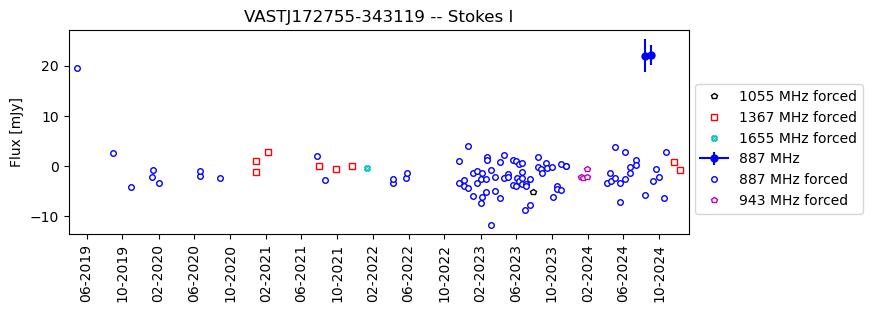

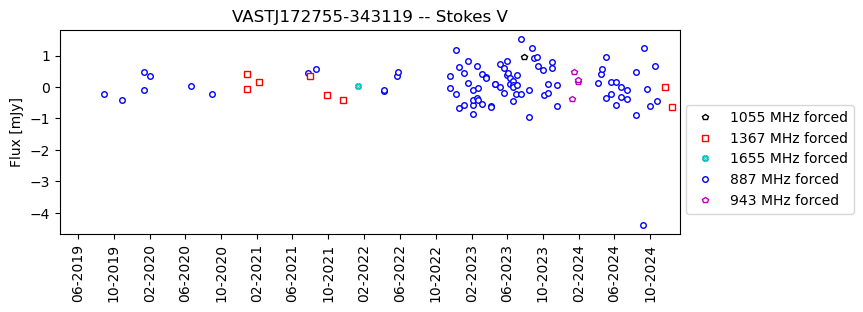

In [39]:
plot_light_curve(source_name, df, 'I')
plot_light_curve(source_name, df, 'V')

NameError: name 'ax_marg_x' is not defined

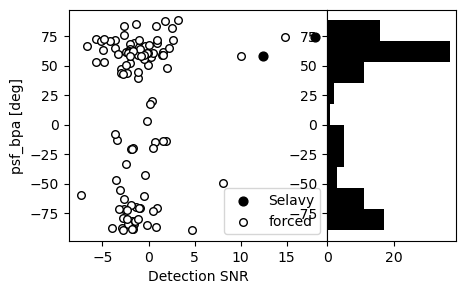

In [40]:
from matplotlib.gridspec import GridSpec


x = np.random.rand(50)
y = np.random.rand(50)

fig = plt.figure(figsize=(5,3))

gs = GridSpec(1,2, width_ratios=[2, 1], wspace=0.0)

ax_joint = fig.add_subplot(gs[0])
#ax_marg_x = fig.add_subplot(gs[0,0:3])
ax_marg_y = fig.add_subplot(gs[1])

ax_joint.scatter(df['flux_int']/df['local_rms'],df['psf_bpa'], s=40, c='k', label='Selavy')
ax_joint.scatter(df['forced_flux_I']/df['local_rms'],df['psf_bpa'], s=30, c='w', edgecolor='k', label='forced')
#plt.colorbar(sc, label='psf_bpa [deg]')
ax_joint.legend()
ax_joint.set_xlabel('Detection SNR')
ax_joint.set_ylabel('psf_bpa [deg]')

#ax_joint.scatter(x,y)
#ax_marg_x.hist(x)
ax_marg_y.hist(df['psf_bpa'],color='k',orientation="horizontal")

# Turn off tick labels on marginals
plt.setp(ax_marg_x.get_xticklabels(), visible=False)
plt.setp(ax_marg_y.get_yticklabels(), visible=False)


# Set labels on marginals
ax_marg_y.set_xlabel('Occurence')
#ax_marg_x.set_ylabel('Marginal y label')
plt.show()

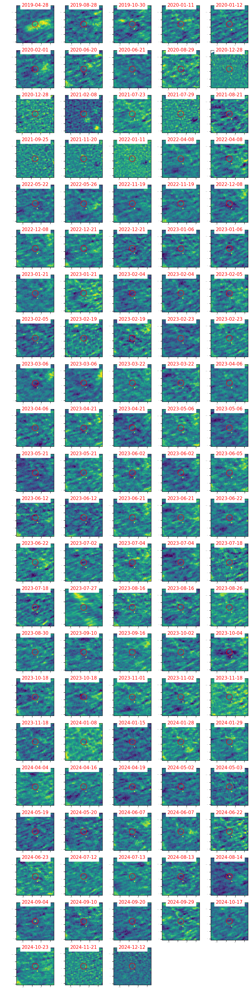

In [41]:
create_plot_grid(stokes='I', df=df, ra=ra, dec=dec)

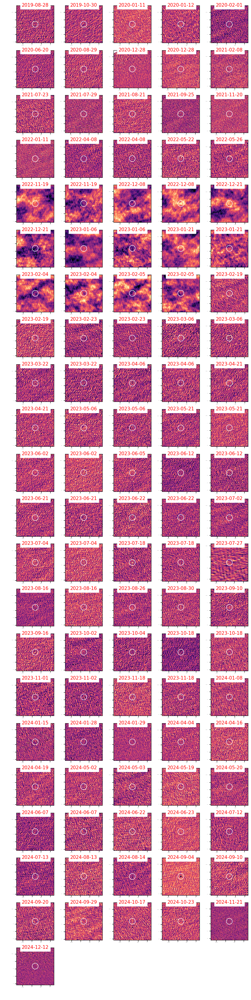

In [42]:
create_plot_grid(stokes='V', df=df, ra=ra, dec=dec)
